# Winter Arctic sea ice state variability (updates through to April 2024)

**Summary**: In this notebook, we provide the fourth update to the original winter Arctic sea ice thickness notebooks with a third additional winter (September 2023 to April 2024) of the monthly gridded winter Arctic sea ice thickness dataset IS2SITMOGR4. 

**Author**: Alek Petty

**Version history**: Version 1 (02/13/2025)

### Import notebook dependencies

In [1]:
# Regular Python library imports 
import xarray as xr 
import numpy as np
import holoviews as hv
import pandas as pd
import hvplot.pandas # noqa

# Helper functions for reading the data from the bucket and plotting
from utils.read_data_utils import read_IS2SITMOGR4, read_book_data
from utils.plotting_utils import static_winter_comparison_lineplot, staticArcticMaps, interactiveArcticMaps, compute_gridcell_winter_means, interactive_winter_comparison_lineplot # Plotting utils 

# Plotting dependencies
#%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
# Sets figure size in the notebook
mpl.rcParams['figure.dpi'] = 200 

# Remove warnings to improve display
import warnings 
warnings.filterwarnings('ignore') 

In [2]:
# Set some plotting parameters
mpl.rcParams.update({
    "text.usetex": False,  # Use LaTeX for rendering
    "font.family": "sans-serif",
    'mathtext.fontset': 'stixsans',
    "lines.linewidth": 1.,
    "font.size": 8,
    #"lines.alpha": 0.8,
    "axes.labelsize": 8,
    "xtick.labelsize": 8,
    "ytick.labelsize": 8,
    "legend.fontsize": 8
})
mpl.rcParams['font.sans-serif'] = ['Arial']

### Read in the Version 3 monthly gridded winter Arctic sea ice data
As before, there are multiple ways of accessing this dataset. The 'official' method is to download the latest data direct from the NSIDC at the following link: https://nsidc.org/data/is2sitmogr4/. 

However, to simplify access and avoid the need to even go through the NSIDC I have also uploaded the raw netcdfs as an aggregated zarr dataset to an AWS S3 bucket. The benefit of the zarr file is that you can read the data on the fly which negates the need to store a local copy of the data. Performance is improved when doing this analysis on the same AWS platform, otherwise it's really just a convenience thing at this size of data (megabytes!).  

In [3]:
#persist=true loads it in to memory now, alternatively this will happen when you try and plot it later. 
IS2SITMOGR4_v3 = read_IS2SITMOGR4(data_type='zarr-s3', persist=True) 

IS2SITMOGR4_v3

load zarr from S3 bucket
zarr_path: s3://icesat-2-sea-ice-us-west-2/IS2SITMOGR4_V3/IS2SITMOGR4_V3_201811-202404.zarr


<xarray.Dataset> Size: 653MB
Dimensions:                         (time: 46, y: 448, x: 304)
Coordinates:
    latitude                        (y, x) float32 545kB 31.1 31.2 ... 34.47
    longitude                       (y, x) float32 545kB 168.3 168.1 ... -9.999
  * time                            (time) datetime64[ns] 368B 2018-11-01 ......
  * x                               (x) float32 1kB -3.838e+06 ... 3.738e+06
  * y                               (y) float32 2kB 5.838e+06 ... -5.338e+06
Data variables: (12/27)
    crs                             (time) int32 184B dask.array<chunksize=(46,), meta=np.ndarray>
    freeboard                       (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    freeboard_int                   (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    ice_density                     (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    ice_density_j22                 (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    ice_thickness                   (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    ...                              ...
    snow_density_sm                 (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    snow_density_w99                (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    snow_depth                      (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    snow_depth_int                  (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    snow_depth_mw99                 (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
    snow_depth_sm                   (time, y, x) float32 25MB dask.array<chunksize=(1, 448, 304), meta=np.ndarray>
Attributes:
    contact:      Alek Petty (akpetty@umd.edu)
    description:  Aggregated IS2SITMOGR4 V3 dataset.
    history:      Created 28/11/23
    reference:    Official NSIDC data doi: 10.5067/CV6JEXEE31HF. Derived data...

Let's quickly plot these up and check things look correct!

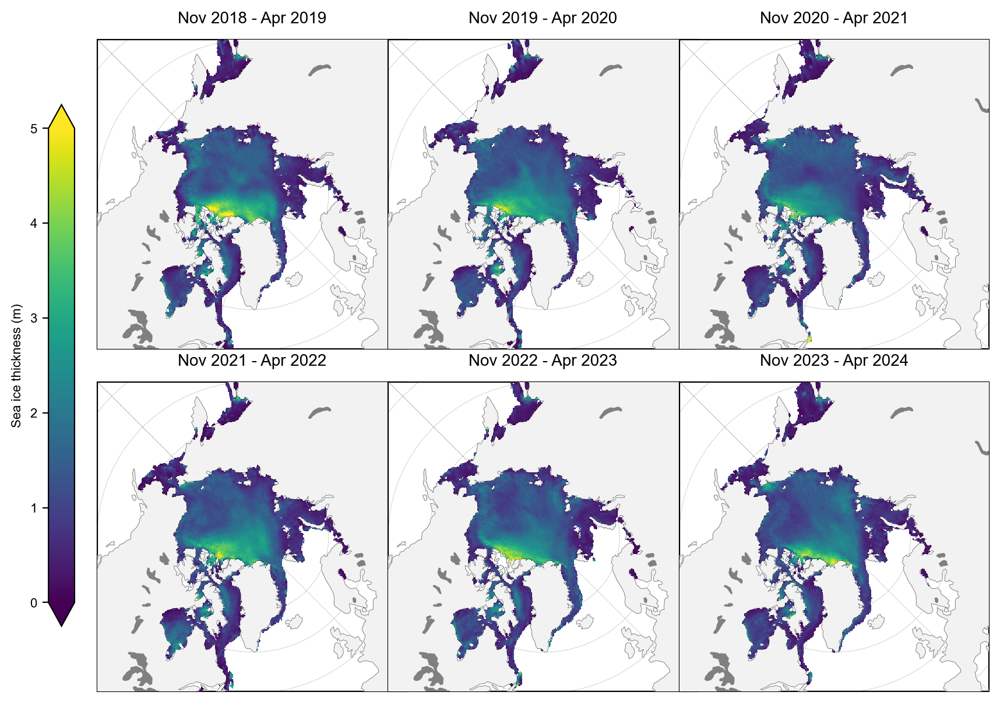

In [4]:
# Years over which to perform analysis (start year of that winter period)
years = [x for x in range(2018, 2023+1)]

thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_int, years=years)
staticArcticMaps(thickness_winter_means, dates=thickness_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness (m)", col_wrap=3, cmap="viridis", vmin=0, vmax=5, out_str='thickness_winter_2018_2024')

In [5]:
# Uncomment this to generate an interactive map too! 
# NB This can be quite large, hence the focus just on one single winter time period...

#interactiveArcticMaps(IS2SITMOGR4_v3.ice_thickness_int.sel(time=slice('2023-09-01', '2024-04-01')), title='IS2SITMOGR4 v3', frame_width=600)

OK good, let's move on to some more analysis

### Set some analysis configuration options

In [6]:
# Set a region mask, e.g. to avoid including some of the more uncertain data in the peripheral seas
innerArctic = [1,2,3,4,5,6]
IS2SITMOGR4_v3_innerArctic = IS2SITMOGR4_v3.where(IS2SITMOGR4_v3.region_mask.isin(innerArctic))

# Drop Sep and October as coverage issues means they are hard to interpret
IS2SITMOGR4_v3_innerArctic = IS2SITMOGR4_v3_innerArctic.where(((IS2SITMOGR4_v3_innerArctic['time.month'] > 10)|(IS2SITMOGR4_v3_innerArctic['time.month'] < 5)), drop=True)

# Uncomment out to set an additional ice type mask too and change the save_label accordingly (0 = FYI, 1 = MYI)
#IS2SITMOGR4_all_innerArctic = IS2SITMOGR4_all_innerArctic.where(IS2SITMOGR4_all_innerArctic.ice_type==1)

save_label='Inner_Arctic'

## Updated Petty et al., (2023) plots including winter 2022-2024

Finally, we also produce the plots as in previous notebooks and the plots presented in Petty et al., (2023) for consistency.

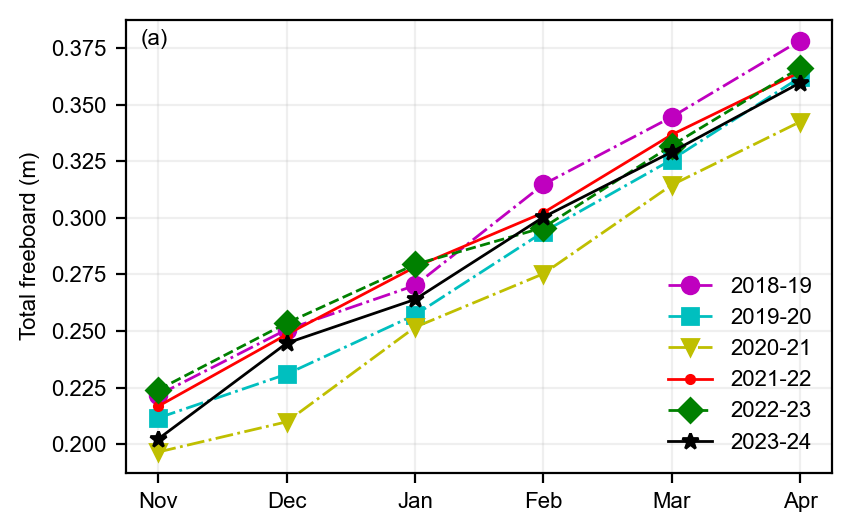

In [7]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.freeboard, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(a)', set_ylabel=r'Total freeboard (m)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','gD--','k*-','b-.'],
                                  save_label=save_label, loc_pos=4, legend=True)

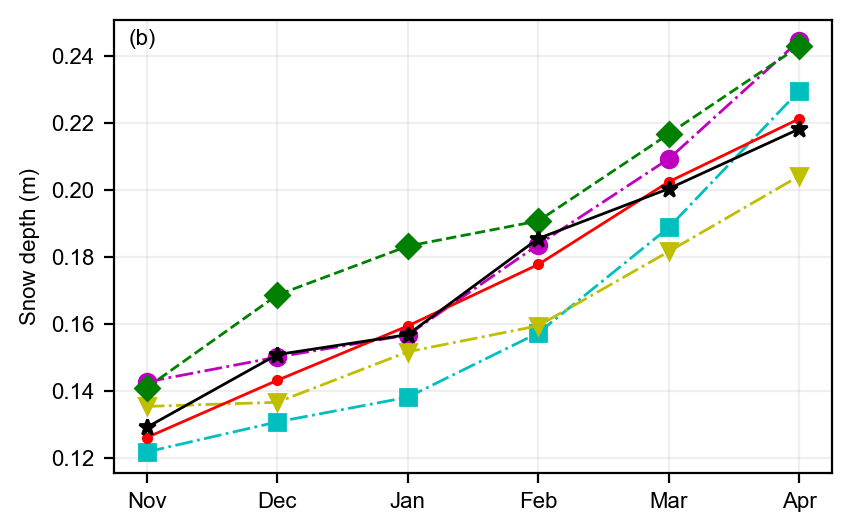

In [8]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.snow_depth, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(b)',set_ylabel='Snow depth (m)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','gD--','k*-','b-.'],
                                  save_label=save_label, legend=False)

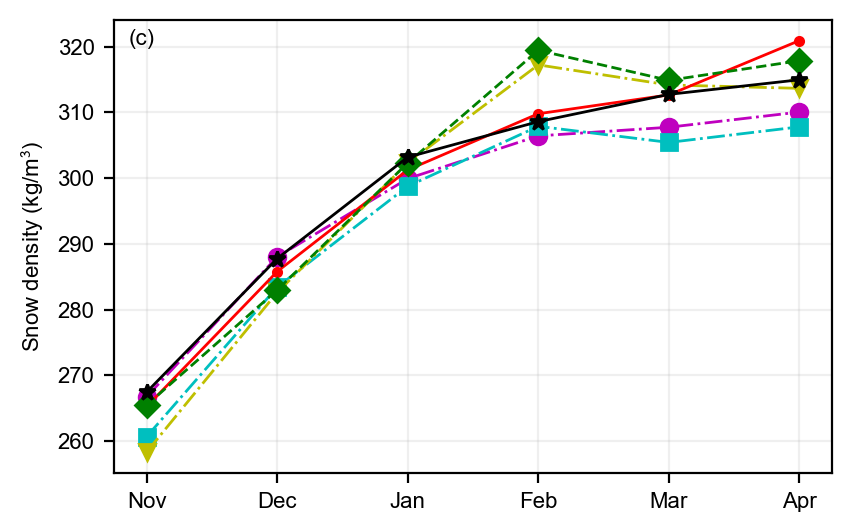

In [9]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.snow_density, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(c)',set_ylabel=r'Snow density (kg/m$^3$)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','gD--','k*-','b-.'],
                                  save_label=save_label, legend=False)

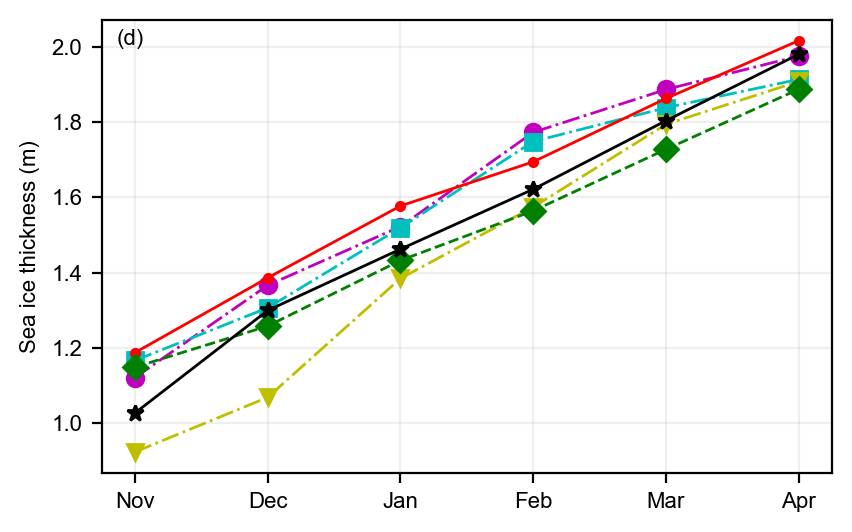

In [10]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.ice_thickness, 
                                  years=years, start_month="Sep", annotation='(d)', figsize=(4.3,2.7), 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','gD--','k*-','b-.'],
                                  set_ylabel='Sea ice thickness (m)', save_label=save_label, legend=False)

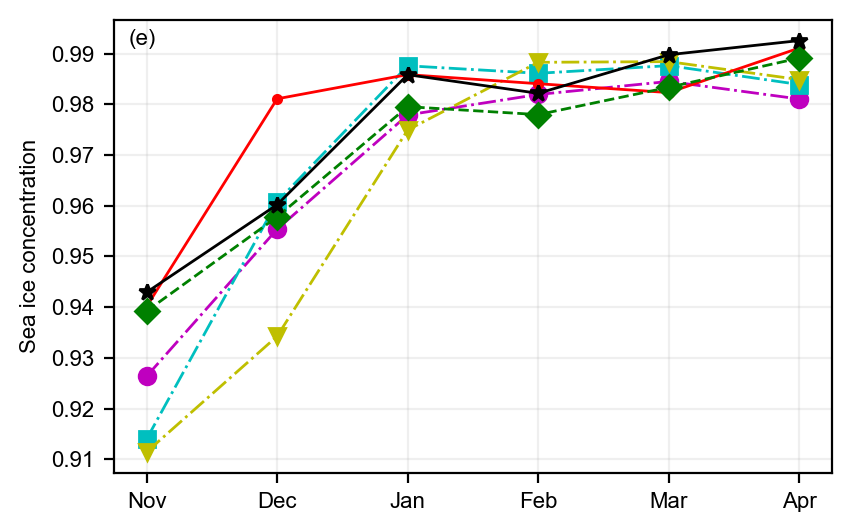

In [11]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.sea_ice_conc, years=years, start_month="Sep", figsize=(4.3,2.7), annotation='(e)', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','gD--','k*-','b-.'],
                                  set_ylabel='Sea ice concentration', save_label=save_label, legend=False)

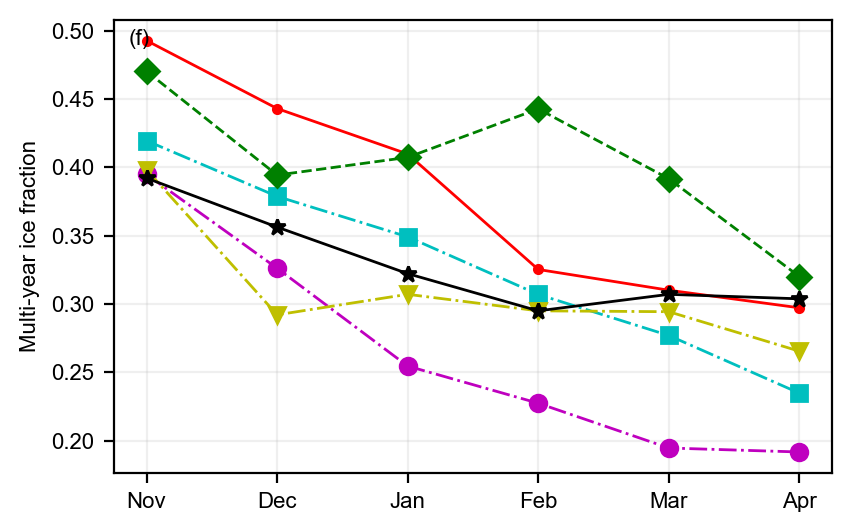

In [12]:
static_winter_comparison_lineplot(IS2SITMOGR4_v3_innerArctic.ice_type, years=years, start_month="Sep", 
                                  figsize=(4.3,2.7), annotation='(f)',set_ylabel='Multi-year ice fraction', 
                                  fmts = ['mo-.','cs-.','yv-.','r.-','gD--','k*-','b-.'],
                                  save_label=save_label, legend=False)

### Winter mean Arctic maps (static)
Compute and map the winter mean sea ice conditions across the years of analysis chosen


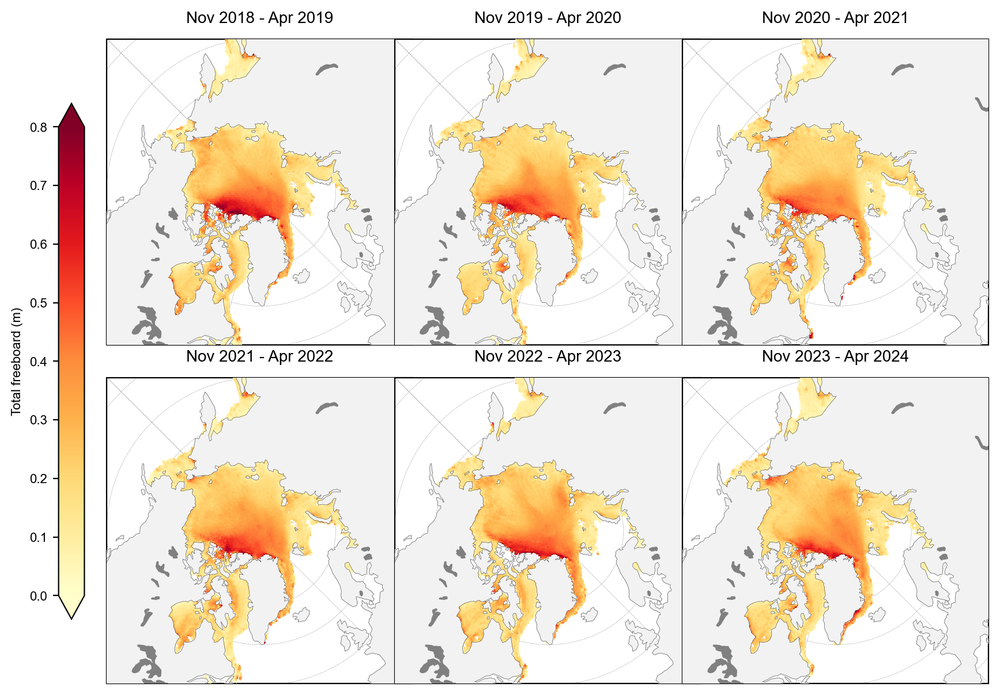

In [13]:
freeboard_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.freeboard_int, years=years)
staticArcticMaps(freeboard_winter_means, dates=freeboard_winter_means.time.values, set_cbarlabel = "Total freeboard (m)", cmap="YlOrRd", col_wrap=3, vmin=0, vmax=0.8, out_str='freeboard_winter_2018_2024')


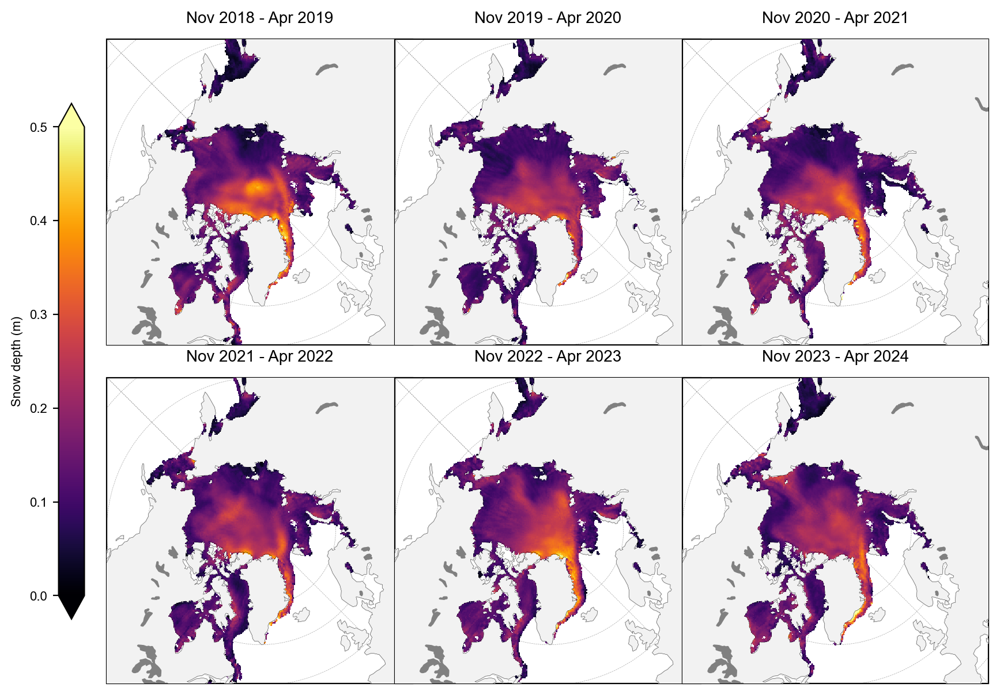

In [14]:
snow_depth_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.snow_depth_int, years=years)
staticArcticMaps(snow_depth_winter_means, dates=snow_depth_winter_means.time.values,set_cbarlabel = "Snow depth (m)", cmap="inferno", col_wrap=3, vmin=0, vmax=0.5, out_str='snowdepth_winter_2018_2024')


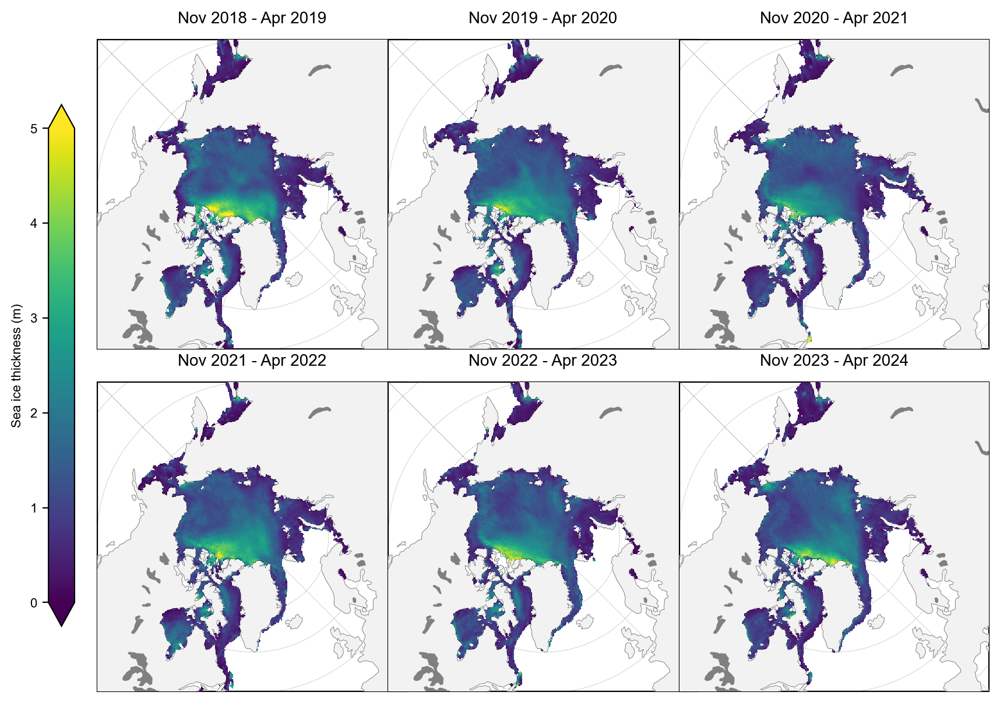

In [15]:
thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_int, years=years)
staticArcticMaps(thickness_winter_means, dates=thickness_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness (m)", col_wrap=3, cmap="viridis", vmin=0, vmax=5, out_str='thickness_winter_2018_2024')


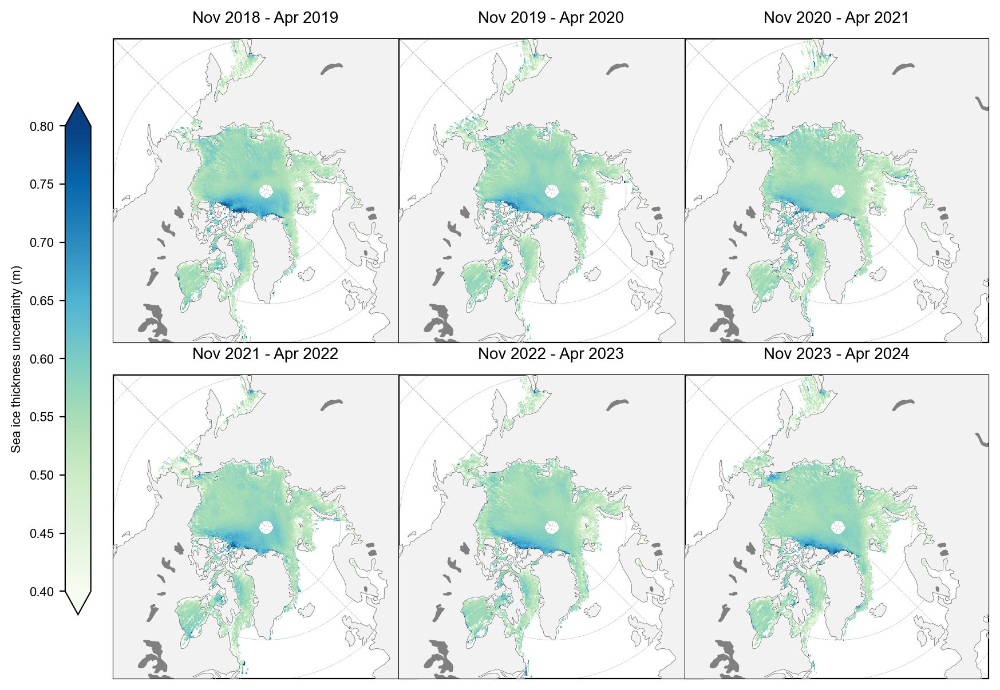

In [16]:
thickness_unc_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_unc, years=years)
staticArcticMaps(thickness_unc_winter_means, dates=thickness_unc_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness uncertainty (m)", col_wrap=3, cmap="GnBu", vmin=0.4, vmax=0.8, out_str='thickness_unc_winter_2018_2024')


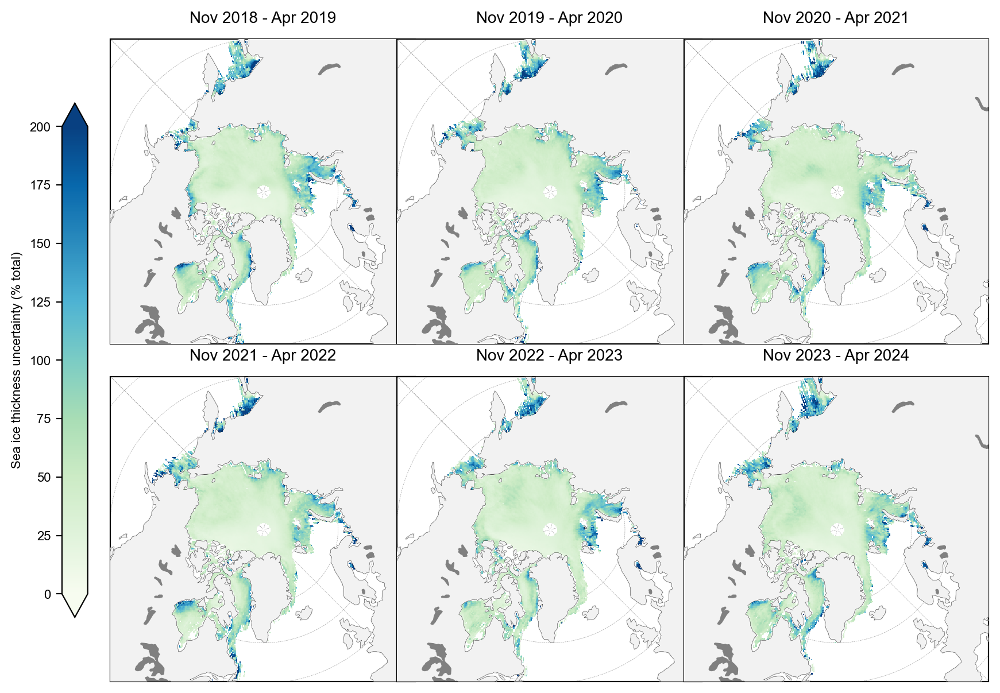

In [17]:

staticArcticMaps(100*thickness_unc_winter_means/thickness_winter_means, dates=thickness_unc_winter_means.time.values,title="", set_cbarlabel = "Sea ice thickness uncertainty (% total)", col_wrap=3, cmap="GnBu", vmin=0, vmax=200, out_str='thickness_unc_winter_2018_2024')


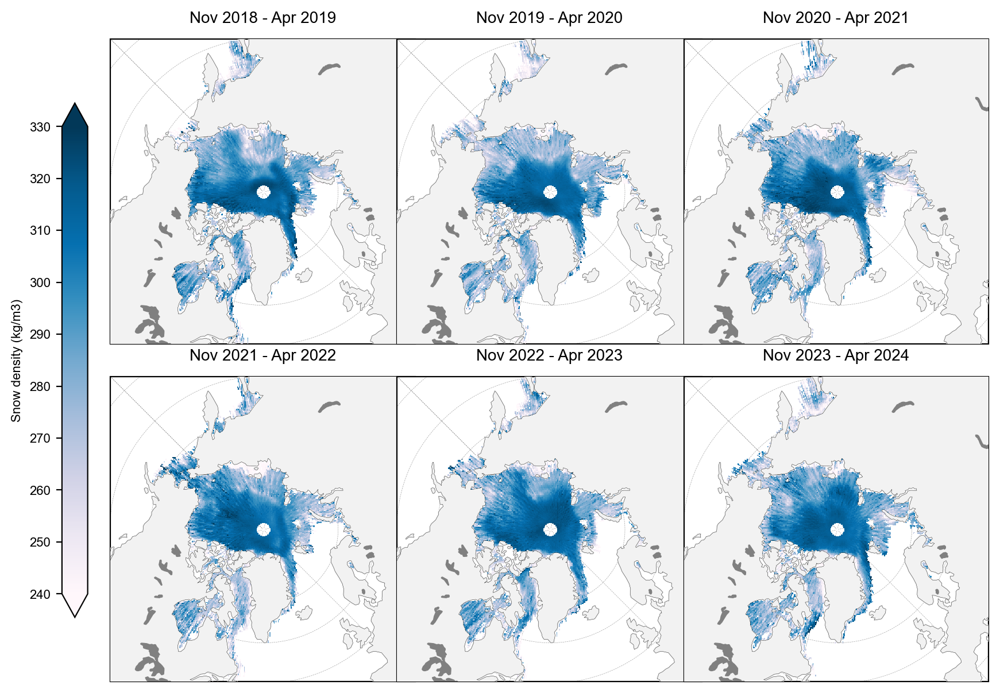

In [18]:
snow_density_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.snow_density, years=years)
staticArcticMaps(snow_density_winter_means, dates=snow_density_winter_means.time.values,set_cbarlabel = "Snow density (kg/m3)", cmap="PuBu", col_wrap=3, vmin=240, vmax=330, out_str='snowdensity_winter_2018_2024')


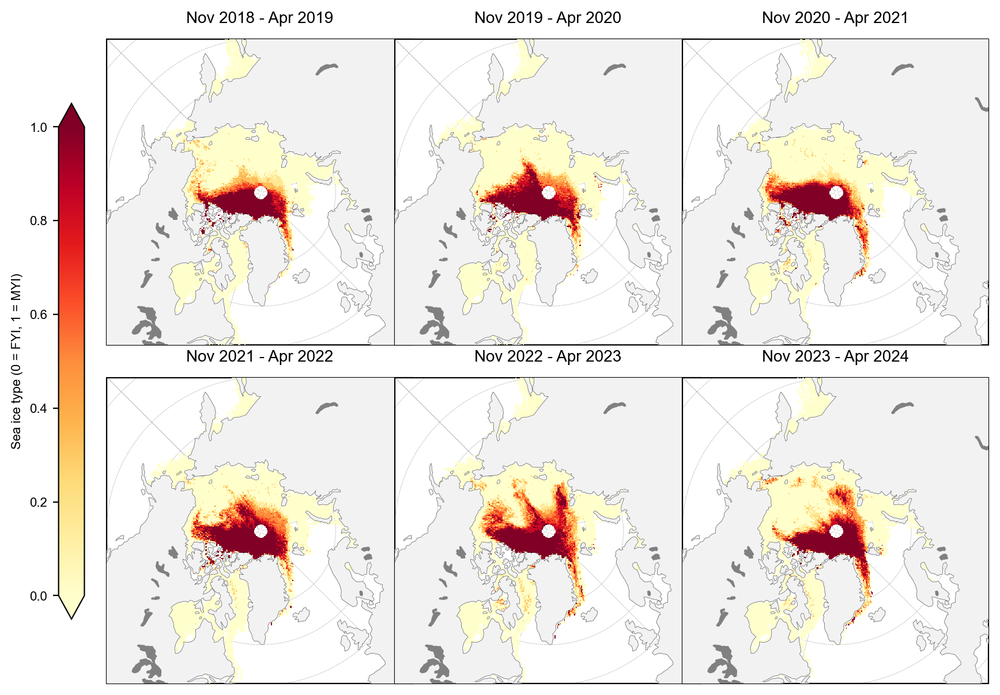

In [19]:
ice_type_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_type, years=years)
staticArcticMaps(ice_type_winter_means, dates=ice_type_winter_means.time.values, set_cbarlabel = "Sea ice type (0 = FYI, 1 = MYI)", col_wrap=3, cmap="YlOrRd", vmin=0, vmax=1, out_str='icetype_winter_2018_2024')


### Winter anomaly plots
Compute and map (static) winter anomaly maps (relative to the mean across the six winters by default) for given variables

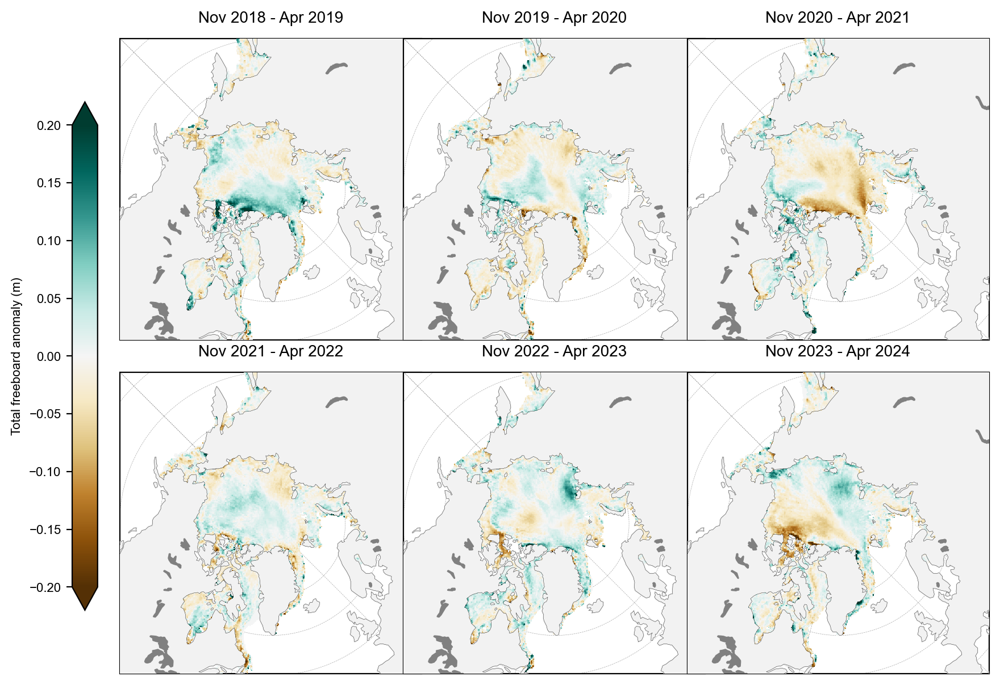

In [20]:
freeboard_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.freeboard_int, years=years)
staticArcticMaps(freeboard_winter_means-freeboard_winter_means.mean(axis=0), dates=freeboard_winter_means.time.values,title="", col_wrap=3, set_cbarlabel = "Total freeboard anomaly (m)", cmap="BrBG", vmin=-0.2, vmax=0.2, out_str='freeboard_winter_anomaly_2018_2024')


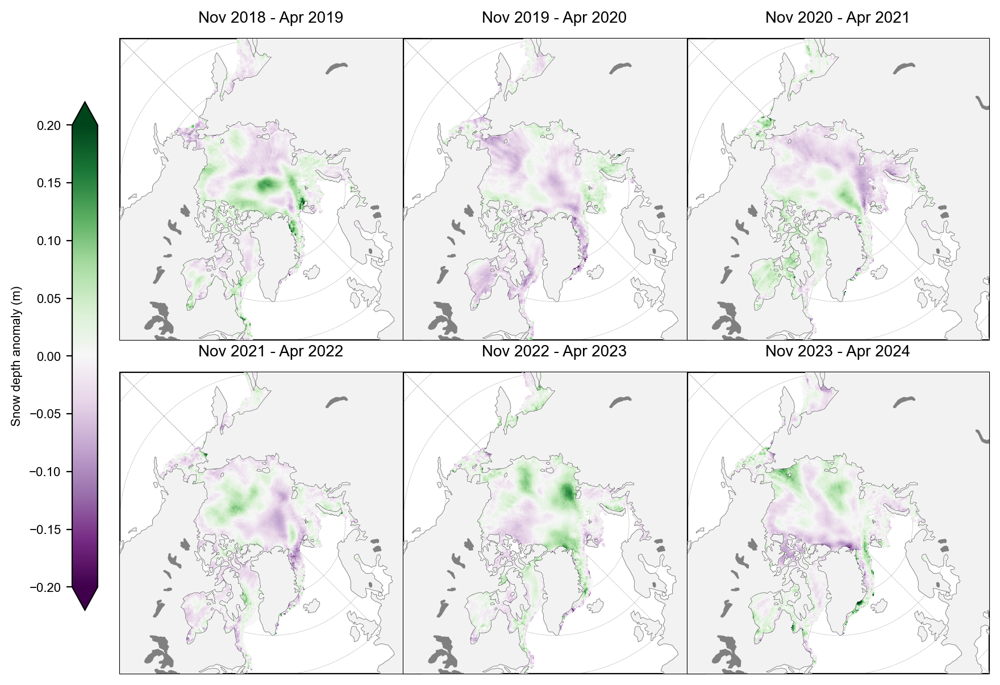

In [21]:
snow_depth_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.snow_depth_int, years=years)
staticArcticMaps(snow_depth_winter_means-snow_depth_winter_means.mean(axis=0), dates=snow_depth_winter_means.time.values,col_wrap=3, set_cbarlabel = "Snow depth anomaly (m)", cmap="PRGn", vmin=-0.2, vmax=0.2, out_str='snowdepth_winter_anomaly_2018_2024')


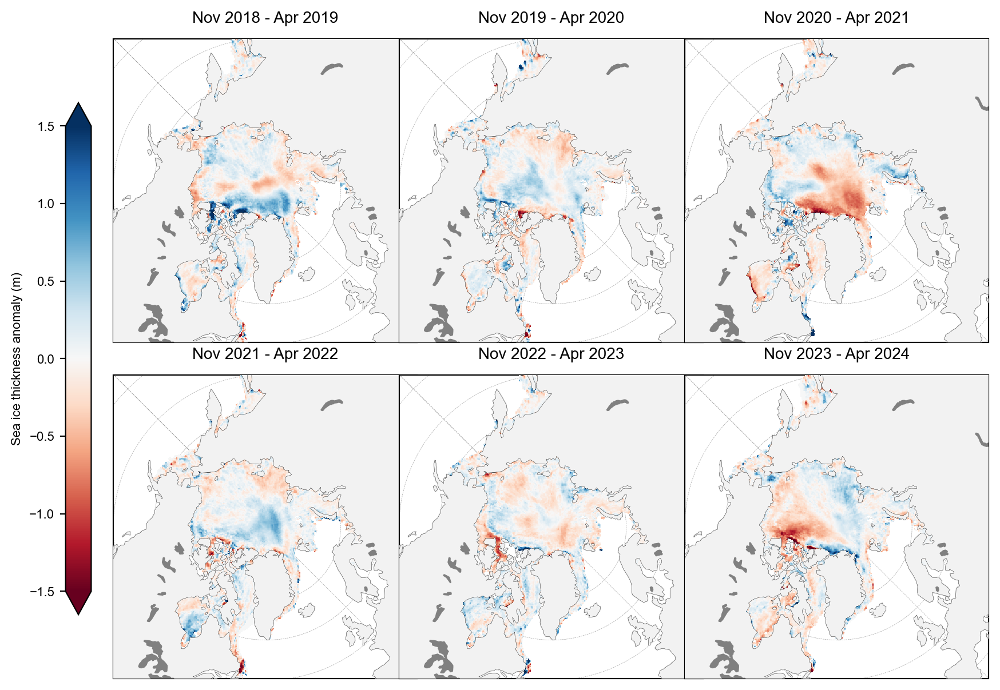

In [22]:
thickness_winter_means = compute_gridcell_winter_means(IS2SITMOGR4_v3.ice_thickness_int, years=years)
staticArcticMaps(thickness_winter_means-thickness_winter_means.mean(axis=0), dates=thickness_winter_means.time.values,col_wrap=3, set_cbarlabel = "Sea ice thickness anomaly (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_winter_anomaly_2018_2024')


### Monthly 2023-2024 anomaly plots
Compute and map (static) monthly anomaly maps (relative to the mean across the six winters for the given month)

Note how persistent the regional monthly anomalies are!

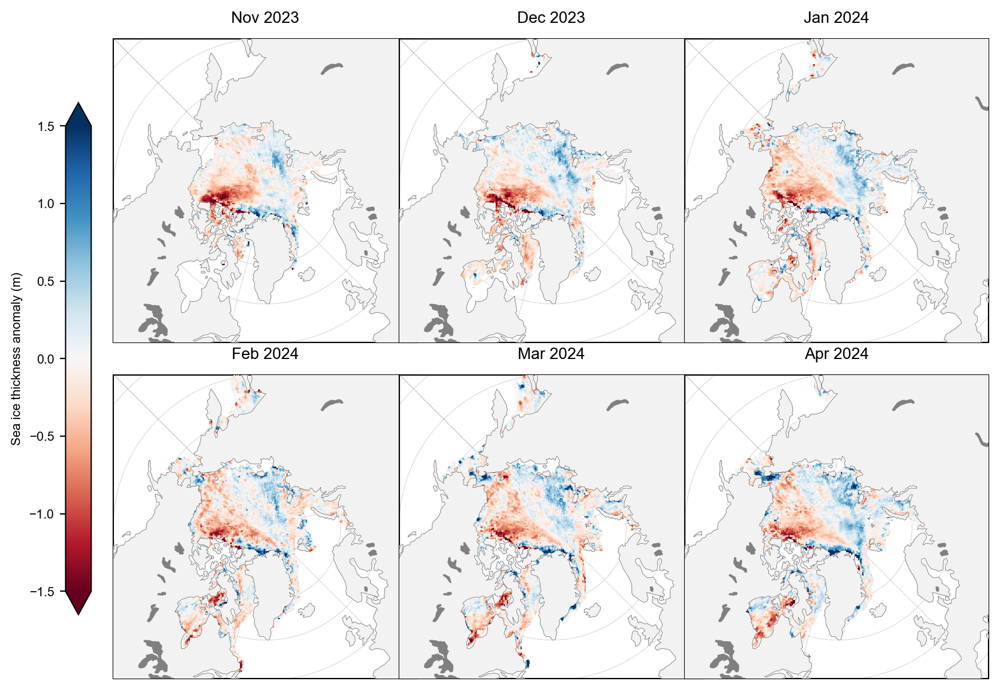

In [23]:
# Step 1: Group data by month (time.month)
thickness_months = IS2SITMOGR4_v3.ice_thickness_int.groupby('time.month')

# Step 2: Calculate the climatological monthly mean
thickness_months_means = thickness_months.mean(dim='time')

# Step 3: Calculate monthly anomalies by subtracting the mean
thickness_month_anomalies = thickness_months - thickness_months_means

thickness_month_anomalies_recent = thickness_month_anomalies.sel(time=slice(pd.Timestamp('2023-11-01'), None))

staticArcticMaps(thickness_month_anomalies_recent,col_wrap=3, dates=['Nov 2023', 'Dec 2023', 'Jan 2024', 'Feb 2024', 'Mar 2024', 'Apr 2024'], set_cbarlabel = "Sea ice thickness anomaly (m)", cmap="RdBu", vmin=-1.5, vmax=1.5, out_str='thickness_month_anomaly_2018_2024')


## References


Petty, A. A., Keeney, N., Cabaj, A., Kushner, P., & Bagnardi, M. (2023). Winter Arctic sea ice thickness from ICESat-2: upgrades to freeboard and snow loading estimates and an assessment of the first three winters of data collection. The Cryosphere,17, 127–156, https://doi.org/10.5194/tc-17-127-2023


    